In [ ]:
import numpy as np 
import pandas as pd 
import os


In [ ]:
!pip install segmentation-models==1.0.1 --verbose

Using pip 24.0 from /opt/conda/lib/python3.10/site-packages/pip (python 3.10)
  Obtaining dependency information for segmentation-models==1.0.1 from https://files.pythonhosted.org/packages/da/b9/4a183518c21689a56b834eaaa45cad242d9ec09a4360b5b10139f23c63f4/segmentation_models-1.0.1-py3-none-any.whl.metadata
  Obtaining dependency information for keras-applications<=1.0.8,>=1.0.7 from https://files.pythonhosted.org/packages/71/e3/19762fdfc62877ae9102edf6342d71b28fbfd9dea3d2f96a882ce099b03f/Keras_Applications-1.0.8-py3-none-any.whl.metadata
  Obtaining dependency information for image-classifiers==1.0.0 from https://files.pythonhosted.org/packages/81/98/6f84720e299a4942ab80df5f76ab97b7828b24d1de5e9b2cbbe6073228b7/image_classifiers-1.0.0-py3-none-any.whl.metadata
  Obtaining dependency information for efficientnet==1.0.0 from https://files.pythonhosted.org/packages/97/82/f3ae07316f0461417dc54affab6e86ab188a5a22f33176d35271628b96e0/efficientnet-1.0.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━

# Preparation

In [4]:
import PIL
from PIL import Image
import numpy as np
import pandas as pd 

import imageio
import imgaug as ia
import imgaug.augmenters as iaa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib

import plotly.offline as pyo
pyo.init_notebook_mode()
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2 
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn import preprocessing
import random
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore")
#!pip install visualkeras

from matplotlib import image
from matplotlib import pyplot

In [ ]:
import os
import pandas as pd

def Create_Directory_DataFrame():
    # Initialize an empty list to hold rows
    rows = []
    basedir = '/kaggle/input/indian-diabetic-retinopathy-image-dataset/A.%20Segmentation/A. Segmentation/1. Original Images/'
    
    # Iterate through each class in the base directory
    for Class in os.listdir(basedir):
        # Iterate through each file in the class directory
        for location in os.listdir(os.path.join(basedir, Class)):
            if location.endswith('.jpg'):
                # Split the class name and check its length
                class_split = Class.split(' ')
                
                # Get the class name safely
                class_name = class_split[1] if len(class_split) > 1 else class_split[0]
                
                # Append a dictionary representing a row to the list
                rows.append({
                    'Class': class_name,
                    'Location': os.path.join(basedir, Class, location),
                    'ID': location.split('.')[0].split('_')[1] if '_' in location else location.split('.')[0]  # Check for '_'
                })

    df = pd.DataFrame(rows)
    
    # Shuffle the DataFrame
    df = df.sample(frac=1).reset_index(drop=True)
    
    return df

# Call the function and display the shape and first few rows
df_origianl_small = Create_Directory_DataFrame()
print(df_origianl_small.shape)
df_origianl_small.head(20)

output_csv_path = '/kaggle/working/original.csv' 
df_origianl_small.to_csv(output_csv_path, index=False) 

(81, 3)


In [6]:
df_origianl_small.head()

,Class,Location,ID
0,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,05
1,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,13
2,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,31
3,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,79
4,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,64


In [ ]:
import os
import pandas as pd

def Create_Directory_Array():
    
    rows = []
    basedir = '/kaggle/input/indian-diabetic-retinopathy-image-dataset/A.%20Segmentation/A. Segmentation/2. All Segmentation Groundtruths/'
    
    
    for Class in os.listdir(basedir):
        
        class_path = os.path.join(basedir, Class)
        if os.path.isdir(class_path):  
          
            class_parts = Class.split(' ')
            class_label = class_parts[1] if len(class_parts) > 1 else class_parts[0]  # Fallback to the whole Class name
            
            for subclass in os.listdir(class_path):
                subclass_path = os.path.join(class_path, subclass)
                if os.path.isdir(subclass_path):  
                    for location in os.listdir(subclass_path):
                        if location.endswith('.tif'):  
                            
                            rows.append({
                                'Class': class_label,
                                'SubClass': subclass,  # If subclassing is not required, you can remove this
                                'Location': os.path.join(class_path, subclass, location),
                                'ID': location.split('.')[0].split('_')[1] if '_' in location else location.split('.')[0]  # Safeguard for IDs
                            })

    return rows  

data_array = Create_Directory_Array()

df_mask = pd.DataFrame(data_array)

df_mask_small = df_mask.sample(frac=1).reset_index(drop=True)

print(df_mask_small.shape)
print(df_mask_small.head(20))
output_csv_path = '/kaggle/working/mask.csv'  
df_mask_small.to_csv(output_csv_path, index=False) 

(363, 4)
       Class           SubClass  \
0    Testing  1. Microaneurysms   
1   Training    2. Haemorrhages   
2    Testing      5. Optic Disc   
3   Training   3. Hard Exudates   
4    Testing      5. Optic Disc   
5    Testing   3. Hard Exudates   
6   Training   3. Hard Exudates   
7    Testing      5. Optic Disc   
8   Training  1. Microaneurysms   
9    Testing   3. Hard Exudates   
10   Testing   3. Hard Exudates   
11   Testing  1. Microaneurysms   
12  Training   3. Hard Exudates   
13  Training  1. Microaneurysms   
14  Training      5. Optic Disc   
15  Training      5. Optic Disc   
16  Training  1. Microaneurysms   
17  Training   3. Hard Exudates   
18  Training  1. Microaneurysms   
19  Training   4. Soft Exudates   

                                             Location  ID  
0   /kaggle/input/indian-diabetic-retinopathy-imag...  65  
1   /kaggle/input/indian-diabetic-retinopathy-imag...  19  
2   /kaggle/input/indian-diabetic-retinopathy-imag...  60  
3   /kaggle/inp

In [ ]:
# Define the unwanted subclass names
unwanted_subclasses = ['4. Soft Exudates', '5. Optic Disc']

# Filter out rows where 'SubClass' column contains unwanted values
df_mask_small = df_mask_small[~df_mask_small['SubClass'].isin(unwanted_subclasses)]

print(df_mask_small.shape)
print(df_mask_small.head(20))

output_csv_path = '/kaggle/working/mask_filtered.csv' 
df_mask_small.to_csv(output_csv_path, index=False)  


(242, 4)
       Class           SubClass  \
0    Testing  1. Microaneurysms   
1   Training    2. Haemorrhages   
3   Training   3. Hard Exudates   
5    Testing   3. Hard Exudates   
6   Training   3. Hard Exudates   
8   Training  1. Microaneurysms   
9    Testing   3. Hard Exudates   
10   Testing   3. Hard Exudates   
11   Testing  1. Microaneurysms   
12  Training   3. Hard Exudates   
13  Training  1. Microaneurysms   
16  Training  1. Microaneurysms   
17  Training   3. Hard Exudates   
18  Training  1. Microaneurysms   
21   Testing   3. Hard Exudates   
22  Training   3. Hard Exudates   
23   Testing   3. Hard Exudates   
24  Training    2. Haemorrhages   
25   Testing    2. Haemorrhages   
26  Training    2. Haemorrhages   

                                             Location  ID  
0   /kaggle/input/indian-diabetic-retinopathy-imag...  65  
1   /kaggle/input/indian-diabetic-retinopathy-imag...  19  
3   /kaggle/input/indian-diabetic-retinopathy-imag...  47  
5   /kaggle/inp

In [9]:
df_mask_small.groupby(['SubClass']).count()

,Class,Location,ID
SubClass,,,
1. Microaneurysms,81,81,81
2. Haemorrhages,80,80,80
3. Hard Exudates,81,81,81


In [10]:
joined_small = pd.merge(df_origianl_small, df_mask_small, left_on='ID', right_on='ID')

joined_small.to_csv('joined.csv', index=False)
joined_small.head()

,Class_x,Location_x,ID,Class_y,SubClass,Location_y
0,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,05,Training,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
1,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,05,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
2,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,05,Training,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...
3,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,13,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
4,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,13,Training,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...


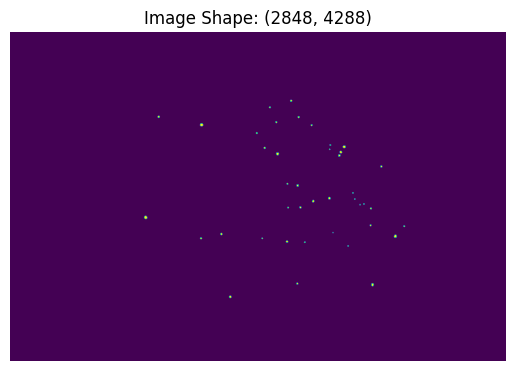

Image Shape: (2848, 4288)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


def display_image_from_dataframe(dataframe, row_index, column_index):
    try:
       
        image_path = dataframe.iloc[row_index, column_index]
        image = Image.open(image_path)

       
        image_array = np.array(image)

       
        plt.imshow(image_array)
        plt.axis('off')  
        plt.title(f"Image Shape: {image_array.shape}")  
        plt.show()

      
        print("Image Shape:", image_array.shape)

    except Exception as e:
        print("Error:", e)

display_image_from_dataframe(joined_small, 23, 5)


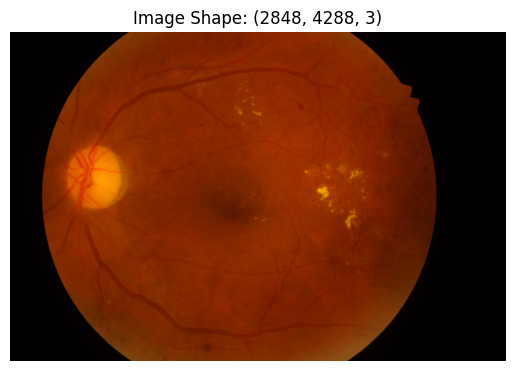

Image Shape: (2848, 4288, 3)


In [12]:
display_image_from_dataframe(joined_small, 23, 1)


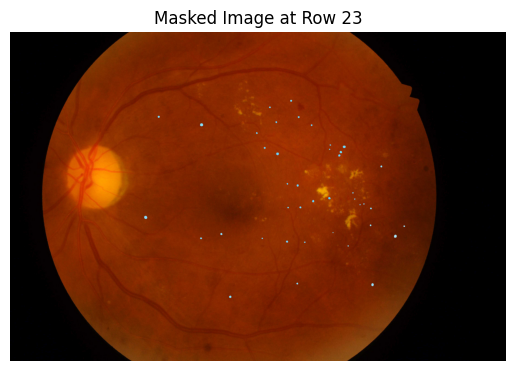

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2


def display_masked_image(dataframe, row_index, image_col_index, mask_col_index):
    try:
       
        image_path = dataframe.iloc[row_index, image_col_index]
        mask_path = dataframe.iloc[row_index, mask_col_index]

        img = cv2.imread(image_path)
        imarray = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  

        if img is None or imarray is None:
            print("Error: Could not read image or mask file.")
            return

        masked = cv2.bitwise_not(img, img, mask=imarray)

        
        plt.imshow(cv2.cvtColor(masked, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display!
        plt.axis('off')
        plt.title(f"Masked Image at Row {row_index}")
        plt.show()

    except Exception as e:
        print("Error:", e)

display_masked_image(joined_small, 23, 1, 5)


In [14]:
#w,h = 2848,4288.
w,h=512,512

In [15]:
from tqdm import tqdm
def load_img(addr,w,h):
    img = cv2.imread(addr,0)
    img = img.astype('float32')
    img = cv2.resize(img, (w,h), interpolation = cv2.INTER_AREA)
    img = img.reshape(w,h,1)
    return img
def load_mask(addr,w,h):
    im = Image.open(addr)
    imarray = np.array(im)
    if len(imarray.shape) == 3:
        imarray = imarray[:,:,0]
    img = cv2.resize(imarray, (w,h), interpolation = cv2.INTER_AREA)
    img = img.reshape(w,h,1)
    return img
def load_data(df,w,h):
    Image = []
    Masks = []
    for i in tqdm(df.index):
        image = load_img(df.loc[i]['Location_x'],w,h)
        mask = load_mask(df.loc[i]['Location_y'],w,h)
        
        Image.append(image)
        Masks.append(mask)
    return np.float32(np.array(Image)) , np.float32(np.array(Masks))

 



In [16]:
segment_choice_small = '1. Microaneurysms'
seg_Microaneurysms_new_small = joined_small[joined_small['SubClass'] ==  segment_choice_small]
print(seg_Microaneurysms_new_small.shape)
seg_Microaneurysms_new_small.head()

(81, 6)


,Class_x,Location_x,ID,Class_y,SubClass,Location_y
1,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,05,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
3,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,13,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
8,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,31,Training,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
11,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,79,Testing,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...
13,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,64,Testing,1. Microaneurysms,/kaggle/input/indian-diabetic-retinopathy-imag...


In [17]:
segment_choice_small = '3. Hard Exudates'
seg_Hard_Exudates_new_small= joined_small[joined_small['SubClass'] ==  segment_choice_small]
print(seg_Hard_Exudates_new_small.shape)
seg_Hard_Exudates_new_small.head()

(81, 6)


,Class_x,Location_x,ID,Class_y,SubClass,Location_y
0,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,05,Training,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
5,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,13,Training,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
7,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,31,Training,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
9,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,79,Testing,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...
14,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,64,Testing,3. Hard Exudates,/kaggle/input/indian-diabetic-retinopathy-imag...


In [18]:
segment_choice_small = '2. Haemorrhages'
seg_Haemorrhages_new_small= joined_small[joined_small['SubClass'] ==  segment_choice_small]
print(seg_Haemorrhages_new_small.shape)
seg_Haemorrhages_new_small.head()

(80, 6)


,Class_x,Location_x,ID,Class_y,SubClass,Location_y
2,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,05,Training,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...
4,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,13,Training,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...
6,Training,/kaggle/input/indian-diabetic-retinopathy-imag...,31,Training,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...
10,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,79,Testing,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...
12,Testing,/kaggle/input/indian-diabetic-retinopathy-imag...,64,Testing,2. Haemorrhages,/kaggle/input/indian-diabetic-retinopathy-imag...


In [ ]:
df_training = seg_Hard_Exudates_new_small[seg_Hard_Exudates_new_small['Class_x'] == 'Training'].reset_index(drop=True)
df_testing = seg_Hard_Exudates_new_small[seg_Hard_Exudates_new_small['Class_x'] == 'Testing'].reset_index(drop=True)

print("Training DataFrame:")
print(df_training)

print("\nTesting DataFrame:")
print(df_testing)

Training DataFrame:
     Class_x                                         Location_x  ID   Class_y  \
0   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  05  Training   
1   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  13  Training   
2   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  31  Training   
3   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  07  Training   
4   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  02  Training   
5   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  45  Training   
6   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  35  Training   
7   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  24  Training   
8   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  48  Training   
9   Training  /kaggle/input/indian-diabetic-retinopathy-imag...  14  Training   
10  Training  /kaggle/input/indian-diabetic-retinopathy-imag...  46  Training   
11  Trai

In [20]:
X, Y = load_data(df_training,w,h)

100%|██████████| 54/54 [00:05<00:00,  9.16it/s]


In [21]:
X_test, Y_test = load_data(df_testing,w,h)

100%|██████████| 27/27 [00:02<00:00,  9.21it/s]


In [22]:
from sklearn.model_selection import train_test_split

X_valid, X_test_final, Y_valid, Y_test_final = train_test_split(
    X_test, Y_test, test_size=0.8, random_state=42  # Adjust test_size and random_state as needed
)

# Model 1

In [23]:
# # First install dependencies
# !pip install efficientnet==1.0.0
# !pip install image-classifiers==1.0.0
# !pip install keras-applications==1.0.8

# # Then install segmentation-models
# !pip install segmentation-models==1.0.1 --no-deps

# # Import and verify
# import segmentation_models as sm

In [24]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [ ]:
import segmentation_models as sm
import tensorflow as tf
import numpy as np

# Model parameters
BACKBONE = 'vgg16'  
BATCH_SIZE = 8
CLASSES = ['Retinal']
LR = 0.0001
EPOCHS = 200
w, h = 512, 512  


preprocess_input = sm.get_preprocessing(BACKBONE)

n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'relu'

optim_gray = tf.keras.optimizers.Adam(LR)

dice_loss = sm.losses.DiceLoss()
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss_gray = 0.9 * dice_loss + 0.1 * focal_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

model_vgg16_relu = sm.Unet(
    BACKBONE,
    input_shape=(w, h, 1),  # Keep input as grayscale
    encoder_weights=None,  # Do not load pretrained weights
    classes=n_classes,
    activation=activation
)

model_vgg16_relu.compile(optimizer=optim_gray, loss=total_loss_gray, metrics=metrics)

class CustomVerbose(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"Epoch {epoch + 1}/{self.params['epochs']} - "
              f"loss: {logs.get('loss'):.4f} - "
              f"ioU_score: {logs.get('iou_score'):.4f} - "
              f"f1-score: {logs.get('f1-score'):.4f}")


In [25]:
model_vgg16_relu.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 512, 512,  │        640 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 512, 512,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 256, 256,  │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 256, 256,  │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 256, 256,  │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 128, 128,  │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 128, 128,  │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 128, 128,  │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 128, 128,  │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 64, 64,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 64, 64,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 64, 64,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 64, 64,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 32, 32,    │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 32, 32,    │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 32, 32,    │  2,359,808 │ block5_conv1[0][

 Total params: 23,751,121 (90.60 MB)

 Trainable params: 23,747,089 (90.59 MB)

 Non-trainable params: 4,032 (15.75 KB)

In [26]:

# Fit the model with the custom verbose output
history_vgg16_relu = model_vgg16_relu.fit(
    x=X,  # Feed the grayscale images
    y=Y,
    batch_size=BATCH_SIZE,
    epochs=550,
    validation_data=(X_valid, Y_valid),  # Validation data
    verbose=0,  # Suppress default output
    callbacks=[CustomVerbose()]  # Include the custom verbose callback
)


I0000 00:00:1730560262.415517     115 service.cc:145] XLA service 0x7e9990004070 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730560262.415572     115 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1730560262.415578     115 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
2024-11-02 15:11:34.840268: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng4{k11=1} for conv (f32[8,64,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,64,128,128]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardInput", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-11-02 15:11:35.076243: E external/local_xla

Epoch 1/550 - loss: 0.9030 - ioU_score: 0.0102 - f1-score: 0.0202
Epoch 2/550 - loss: 0.8926 - ioU_score: 0.0250 - f1-score: 0.0481
Epoch 3/550 - loss: 0.8891 - ioU_score: 0.0389 - f1-score: 0.0744
Epoch 4/550 - loss: 0.8863 - ioU_score: 0.0432 - f1-score: 0.0819
Epoch 5/550 - loss: 0.8837 - ioU_score: 0.0512 - f1-score: 0.0950
Epoch 6/550 - loss: 0.8816 - ioU_score: 0.0638 - f1-score: 0.1186
Epoch 7/550 - loss: 0.8793 - ioU_score: 0.0717 - f1-score: 0.1328
Epoch 8/550 - loss: 0.8768 - ioU_score: 0.0885 - f1-score: 0.1591
Epoch 9/550 - loss: 0.8748 - ioU_score: 0.0998 - f1-score: 0.1778
Epoch 10/550 - loss: 0.8736 - ioU_score: 0.1006 - f1-score: 0.1774
Epoch 11/550 - loss: 0.8715 - ioU_score: 0.1037 - f1-score: 0.1856
Epoch 12/550 - loss: 0.8701 - ioU_score: 0.1100 - f1-score: 0.1910
Epoch 13/550 - loss: 0.8682 - ioU_score: 0.1374 - f1-score: 0.2312
Epoch 14/550 - loss: 0.8667 - ioU_score: 0.1313 - f1-score: 0.2235
Epoch 15/550 - loss: 0.8640 - ioU_score: 0.1454 - f1-score: 0.2467
Epoc

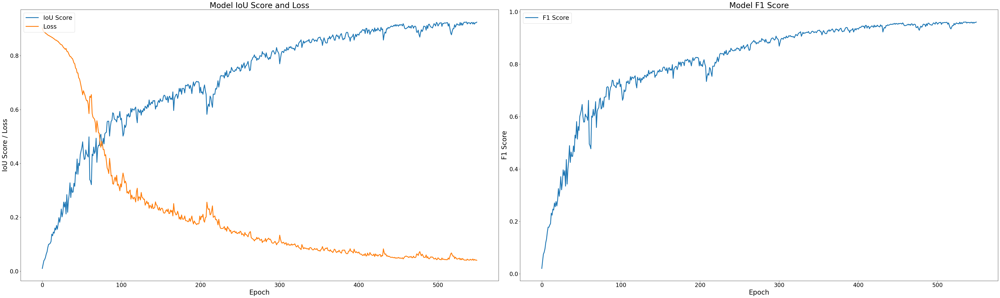

In [ ]:
import matplotlib.pyplot as plt

# Assuming history_vgg16_relu.history contains the training logs

plt.figure(figsize=(50, 15))

# IoU Score 
plt.subplot(121)
plt.plot(history_vgg16_relu.history['iou_score'], linewidth=3)  #
plt.plot(history_vgg16_relu.history['loss'], linewidth=3)
plt.title('Model IoU Score and Loss', fontsize=28)  
plt.ylabel('IoU Score / Loss', fontsize=24)  
plt.xlabel('Epoch', fontsize=24)  
plt.xticks(fontsize=20)  
plt.yticks(fontsize=20)  
plt.legend(['IoU Score', 'Loss'], loc='upper left', fontsize=22)  

# Plot training F1 score values
plt.subplot(122)
plt.plot(history_vgg16_relu.history['f1-score'], linewidth=3) 
plt.title('Model F1 Score', fontsize=28) 
plt.ylabel('F1 Score', fontsize=24)  
plt.xlabel('Epoch', fontsize=24)  
plt.xticks(fontsize=20)  
plt.yticks(fontsize=20)  
plt.legend(['F1 Score'], loc='upper left', fontsize=22)  

# Show the plots
plt.tight_layout()
plt.show()


In [28]:
preds = model_vgg16_relu.predict(X_test_final).round()

2024-11-02 16:10:19.639032: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[22,32,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[22,192,256,256]{3,2,1,0}, f32[32,192,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-11-02 16:10:20.413226: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.774394973s
Trying algorithm eng0{} for conv (f32[22,32,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[22,192,256,256]{3,2,1,0}, f32[32,192,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_

1/1 ━━━━━━━━━━━━━━━━━━━━ 57s 57s/step


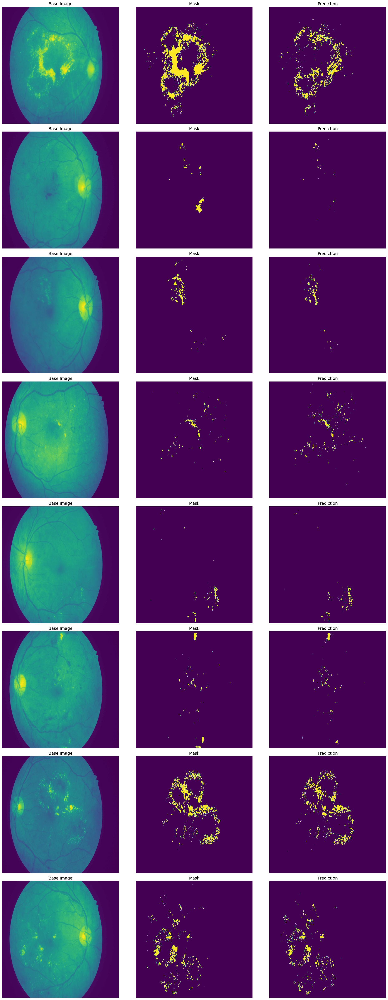

In [ ]:
import matplotlib.pyplot as plt
import cv2  


num_preds = preds.shape[0]


num_cols = 3 
num_rows = (num_preds + num_cols - 1) // num_cols  


plt.figure(figsize=(20, num_rows * 6))

max_plots = num_rows * num_cols

for i in range(min(num_preds, max_plots // num_cols)):
    
    plt.subplot(num_rows, num_cols, i * num_cols + 1)
    img = X_test_final[i].reshape(w, h)
    img = img.astype('uint8')
    plt.imshow(img)
    plt.title("Base Image", fontsize=14)  
    plt.axis('off')  

    # Mask
    plt.subplot(num_rows, num_cols, i * num_cols + 2)
    yop = Y_test_final[i].reshape(w, h)
    yop = yop.astype('uint8')
    plt.imshow(yop)
    plt.title("Mask", fontsize=14)  
    plt.axis('off')  

    # Prediction
    plt.subplot(num_rows, num_cols, i * num_cols + 3)
    prd = preds[i][..., 0].squeeze()
    prd = prd.astype('uint8')
    img = X_test_final[i].reshape(w, h)
    img = img.astype('uint8')
    plt.imshow(prd)
    plt.title("Prediction", fontsize=14)  
    plt.axis('off')  

plt.tight_layout()
plt.show()

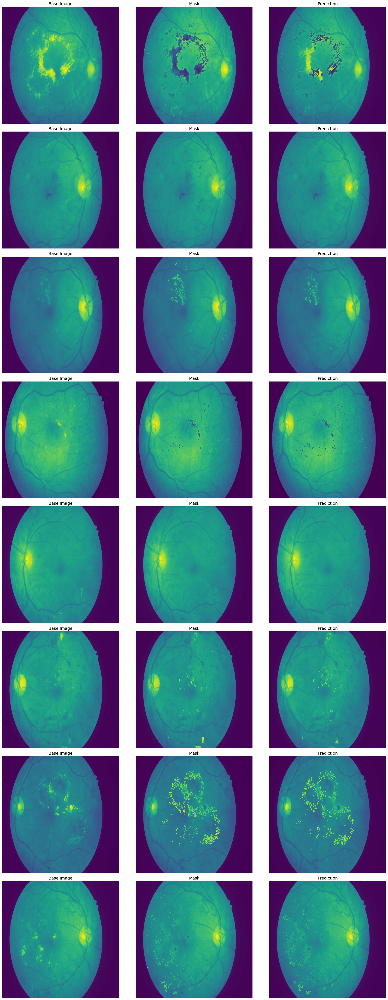

In [ ]:
import matplotlib.pyplot as plt
import cv2  


num_preds = preds.shape[0]


num_cols = 3  
num_rows = (num_preds + num_cols - 1) // num_cols 


plt.figure(figsize=(20, num_rows * 6))

max_plots = num_rows * num_cols

for i in range(min(num_preds, max_plots // num_cols)):
    # Base Image
    plt.subplot(num_rows, num_cols, i * num_cols + 1)
    img = X_test_final[i].reshape(w, h)
    img = img.astype('uint8')
    plt.imshow(img)
    plt.title("Base Image", fontsize=14)  
    plt.axis('off')  

    # Mask
    plt.subplot(num_rows, num_cols, i * num_cols + 2)
    yop = Y_test_final[i].reshape(w, h)
    yop = yop.astype('uint8')
    pim = cv2.bitwise_not(img, img, mask=yop)
    plt.imshow(pim)
    plt.title("Mask", fontsize=14)  
    plt.axis('off')  

    # Prediction
    plt.subplot(num_rows, num_cols, i * num_cols + 3)
    prd = preds[i][..., 0].squeeze()
    prd = prd.astype('uint8')
    img = X_test_final[i].reshape(w, h)
    img = img.astype('uint8')
    pimm = cv2.bitwise_not(img, img, mask=prd)
    plt.imshow(pimm)
    plt.title("Prediction", fontsize=14)  
    plt.axis('off')  

plt.tight_layout()
plt.show()


In [31]:
model_vgg16_relu.save('exudate_model.h5')

# Converting all the images from the larger dataset

In [26]:
from tensorflow.keras.models import load_model

loaded_model = load_model(r"/kaggle/input/exudate_segementation/tensorflow2/default/1/exudate_model.h5",compile=False)

In [ ]:
import segmentation_models as sm


# Model parameters
BACKBONE = 'vgg16'  
BATCH_SIZE = 8
CLASSES = ['Retinal']
LR = 0.0001
EPOCHS = 200
w, h = 512, 512  

preprocess_input = sm.get_preprocessing(BACKBONE)

n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1) 
activation = 'sigmoid' if n_classes == 1 else 'relu'

optim_gray = tf.keras.optimizers.Adam(LR)

dice_loss = sm.losses.DiceLoss()
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss_gray = 0.9 * dice_loss + 0.1 * focal_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

loaded_model.compile(optimizer=optim_gray, loss=total_loss_gray, metrics=metrics)

In [ ]:
optim_gray = tf.keras.optimizers.Adam(LR)



In [ ]:
import os 
import pandas as pd 

import os

# Base directory path (change this to the dataset path in Kaggle or if in google colab)
base_dir = "/kaggle/input/aptos2019"


def print_directory_structure(base_dir, max_files=2):
    for root, dirs, files in os.walk(base_dir):
        indent_level = root.replace(base_dir, "").count(os.sep)
        indent = " " * 4 * indent_level
        print(f"{indent}{os.path.basename(root)}/")

        # Limit the number of files displayed
        for file in files[:max_files]:
            print(f"{indent}    {file}")
        if len(files) > max_files:
            print(f"{indent}    ... ({len(files) - max_files} more files)")

print_directory_structure(base_dir)


aptos2019/
    valid.csv
    test.csv
    ... (1 more files)
    val_images/
        val_images/
            17f6c7072f61.png
            0243404e8a00.png
            ... (364 more files)
    train_images/
        train_images/
            6dcde47060f9.png
            b49b2fac2514.png
            ... (2928 more files)
    test_images/
        test_images/
            ef476be214d4.png
            ec363f48867b.png
            ... (364 more files)


In [28]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
def load_and_preprocess_image(image_path, target_size=(512, 512)):
    """
    Load and preprocess an image for the exudate segmentation model.
    """

    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Image not found at {image_path}")
        
    img = cv2.imread(image_path, 0)
    if img is None:
        raise ValueError(f"Could not load image at {image_path}")
    
    img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)
    
    img = img.astype('float32')
    img = img.reshape(1, *target_size, 1)  
    
    return img

def visualize_results(original_img, prediction, title="Exudate Segmentation Results"):
    """
    Visualize original image and its segmentation prediction side by side.
    """
    plt.figure(figsize=(15, 5))
    
    # Original image
    plt.subplot(131)
    plt.imshow(original_img, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')
    
    # Prediction mask
    plt.subplot(132)
    plt.imshow(prediction, cmap='gray')
    plt.title("Predicted Mask")
    plt.axis('off')
    
    # Overlay
    plt.subplot(133)
    overlay = cv2.bitwise_not(original_img, original_img, mask=prediction.astype('uint8'))
    plt.imshow(overlay, cmap='gray')
    plt.title("Overlay")
    plt.axis('off')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Specific image paths
image_paths = [
    '/kaggle/input/aptos2019/test_images/test_images/e4dcca36ceb4.png',
    '/kaggle/input/aptos2019/test_images/test_images/e4f12411fd85.png'
]

I0000 00:00:1733665489.160643     114 service.cc:145] XLA service 0x780f8c0054c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733665489.160700     114 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


I0000 00:00:1733665494.451722     114 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


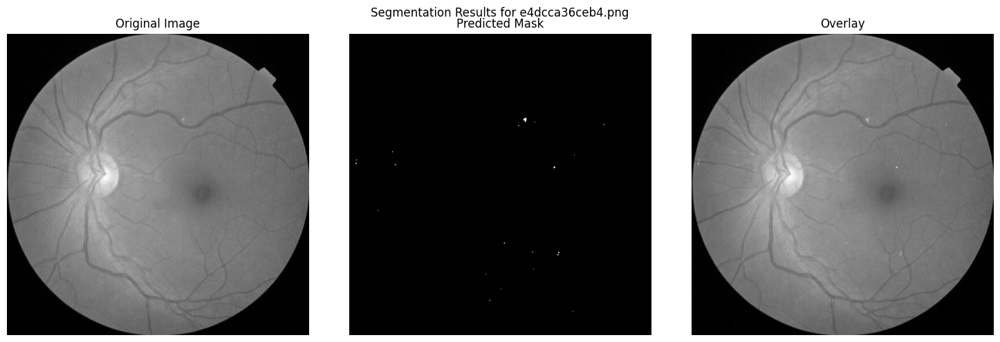

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


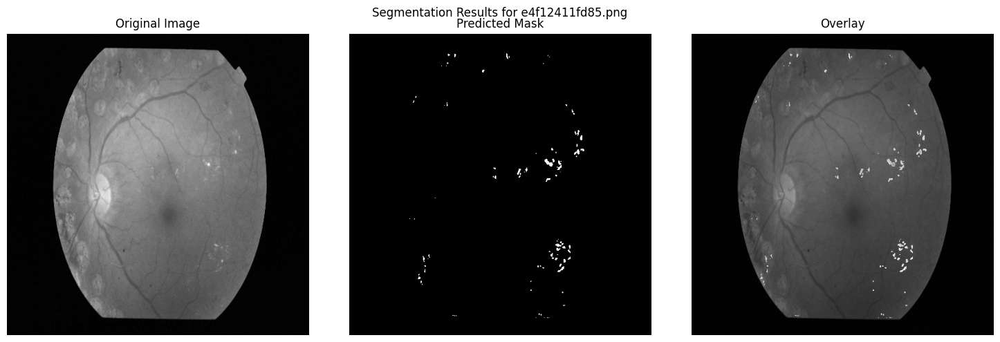

In [ ]:
for img_path in image_paths:
    try:
        img_name = os.path.basename(img_path)
        
        processed_img = load_and_preprocess_image(img_path)
        
        prediction = loaded_model.predict(processed_img)
        
        # Post-process prediction
        prediction = prediction.squeeze()
        prediction = (prediction > 0.5).astype('uint8') * 255
        
        original_img = cv2.imread(img_path, 0)
        original_img = cv2.resize(original_img, (512, 512))

        visualize_results(original_img, prediction, f"Segmentation Results for {img_name}")
        
    except Exception as e:
        print(f"Error processing {img_path}: {str(e)}")

In [ ]:
train_path ="/kaggle/input/aptos2019/train_images/train_images"

In [47]:
# Now segmenting the whoel dataset, for exudates. 

In [31]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
def create_output_directories():
    """Create directories for storing processed images and masks"""
    base_dir = '/kaggle/working/segmented_dataset'
    dirs = {
        'original': os.path.join(base_dir, 'original_images'),
        'masks': os.path.join(base_dir, 'masks'),
        'overlays': os.path.join(base_dir, 'overlays')
    }
    
    for dir_path in dirs.values():
        os.makedirs(dir_path, exist_ok=True)
    
    return dirs

def load_and_preprocess_image(image_path, target_size=(512, 512)):
    """Load and preprocess an image for the segmentation model"""
    img = cv2.imread(image_path, 0)
    if img is None:
        raise ValueError(f"Could not load image at {image_path}")
    
    img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)
    img_float = img.astype('float32')
    img_input = img_float.reshape(1, *target_size, 1)
    
    return img_input, img

def save_processed_images(original_img, mask, overlay, img_name, output_dirs):
    """Save processed images to their respective directories"""
    # Save original
    cv2.imwrite(os.path.join(output_dirs['original'], img_name), original_img)
    
    # Save mask
    cv2.imwrite(os.path.join(output_dirs['masks'], img_name), mask)
    
    # Save overlay
    cv2.imwrite(os.path.join(output_dirs['overlays'], img_name), overlay)

def process_dataset():
    output_dirs = create_output_directories()
    
    input_dir = '/kaggle/input/aptos2019/train_images/train_images'
    
    image_files = [f for f in os.listdir(input_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    
    results = []
    
    for img_name in tqdm(image_files, desc="Processing images"):
        try:
            img_path = os.path.join(input_dir, img_name)
            
            processed_img, original_img = load_and_preprocess_image(img_path)
            
          
            prediction = loaded_model.predict(processed_img, verbose=0)
            
          
            mask = (prediction.squeeze() > 0.5).astype('uint8') * 255
            
            
            overlay = cv2.bitwise_not(original_img, original_img, mask=mask)
            
           
            save_processed_images(original_img, mask, overlay, img_name, output_dirs)
            
            
            exudate_pixels = np.count_nonzero(mask)
            total_pixels = mask.size
            exudate_percentage = (exudate_pixels / total_pixels) * 100
            
            
            results.append({
                'image_name': img_name,
                'original_path': os.path.join(output_dirs['original'], img_name),
                'mask_path': os.path.join(output_dirs['masks'], img_name),
                'overlay_path': os.path.join(output_dirs['overlays'], img_name),
                'exudate_percentage': exudate_percentage,
                'exudate_pixels': exudate_pixels
            })
            
        except Exception as e:
            print(f"\nError processing {img_name}: {str(e)}")
            continue
    
    df = pd.DataFrame(results)

    csv_path = '/kaggle/working/segmented_dataset/segmentation_results.csv'
    df.to_csv(csv_path, index=False)
    
    return df


In [33]:
df_results_exudates = process_dataset()

Processing images: 100%|██████████| 2930/2930 [09:26<00:00,  5.17it/s]


In [ ]:
output_dir = '/kaggle/working/segmented_images_exudates'
os.makedirs(output_dir, exist_ok=True)

# Input directory with all APTOS images
input_dir = '/kaggle/input/aptos2019/train_images/train_images'

image_files = [f for f in os.listdir(input_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

for img_name in tqdm(image_files, desc="Processing images"):
    try:
        
        img_path = os.path.join(input_dir, img_name)
        img = cv2.imread(img_path, 0)
        img = cv2.resize(img, (512, 512))
        img_input = img.astype('float32').reshape(1, 512, 512, 1)
        
        prediction = loaded_model.predict(img_input, verbose=0)
        

        mask = (prediction.squeeze() > 0.5).astype('uint8') * 255
        
        segmented_img = cv2.bitwise_not(img, img, mask=mask)
        
        output_path = os.path.join(output_dir, img_name)
        cv2.imwrite(output_path, segmented_img)
        
    except Exception as e:
        print(f"\nError processing {img_name}: {str(e)}")
        continue

Processing images: 100%|██████████| 2930/2930 [08:39<00:00,  5.64it/s]


In [35]:
print(f"\nDone! Segmented images saved to {output_dir}")


Done! Segmented images saved to /kaggle/working/segmented_images_exudates


In [ ]:
import shutil


output_dir = "/kaggle/working/"  # Replace with your actual directory path in colab
zip_path = "/kaggle/working/output_directory.zip"

shutil.make_archive(output_dir, 'zip', output_dir)

print(f"Directory compressed into: {zip_path}")


Directory compressed into: /kaggle/working/output_directory.zip


In [37]:
!zip -r file.zip /kaggle/working

  adding: kaggle/working/ (stored 0%)
  adding: kaggle/working/.zip (stored 0%)
  adding: kaggle/working/joined.csv (deflated 97%)
  adding: kaggle/working/mask.csv (deflated 96%)
  adding: kaggle/working/.virtual_documents/ (stored 0%)
  adding: kaggle/working/original.csv (deflated 95%)
  adding: kaggle/working/mask_filtered.csv (deflated 96%)
  adding: kaggle/working/segmented_dataset/ (stored 0%)
  adding: kaggle/working/segmented_dataset/masks/ (stored 0%)
  adding: kaggle/working/segmented_dataset/masks/c70d09370109.png (deflated 51%)
  adding: kaggle/working/segmented_dataset/masks/6b07971c3bf6.png (deflated 55%)
  adding: kaggle/working/segmented_dataset/masks/9faad91b6578.png (deflated 20%)
  adding: kaggle/working/segmented_dataset/masks/4dc2211a1c31.png (deflated 20%)
  adding: kaggle/working/segmented_dataset/masks/6cfb7b44ef6f.png (deflated 91%)
  adding: kaggle/working/segmented_dataset/masks/6ba5ed791444.png (deflated 24%)
  adding: kaggle/working/segmented_dataset/masks

In [38]:
from IPython.display import FileLink
FileLink(r'file.zip')

/kaggle/working/file.zip

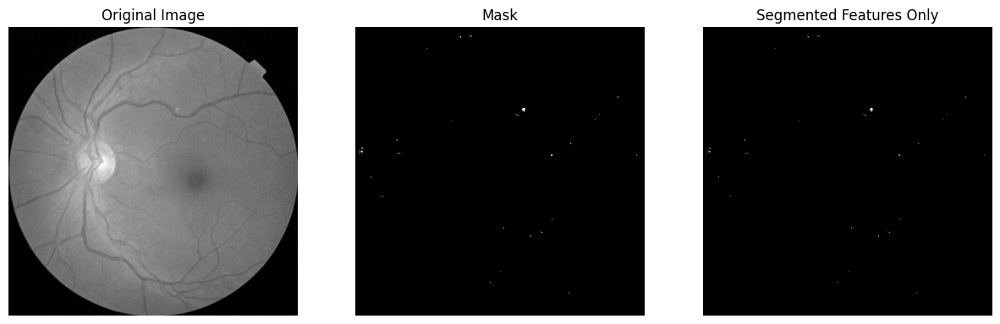

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Test with one image only
test_img_path = '/kaggle/input/aptos2019/test_images/test_images/e4dcca36ceb4.png'

# Load and preprocess image
img = cv2.imread(test_img_path, 0)
img = cv2.resize(img, (512, 512))
img_input = img.astype('float32').reshape(1, 512, 512, 1)

# Get prediction
prediction = loaded_model.predict(img_input, verbose=0)

# Convert prediction to binary mask
mask = (prediction.squeeze() > 0.5).astype('uint8') * 255

# Extract just the segmented parts
segmented_features = cv2.bitwise_and(img, img, mask=mask)

plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('off')

plt.subplot(133)
plt.imshow(segmented_features, cmap='gray')
plt.title('Segmented Features Only')
plt.axis('off')

plt.show()

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

test_image_paths = [
    '/kaggle/input/aptos2019/test_images/test_images/e4dcca36ceb4.png',
    '/kaggle/input/aptos2019/test_images/test_images/e4f12411fd85.png'
]


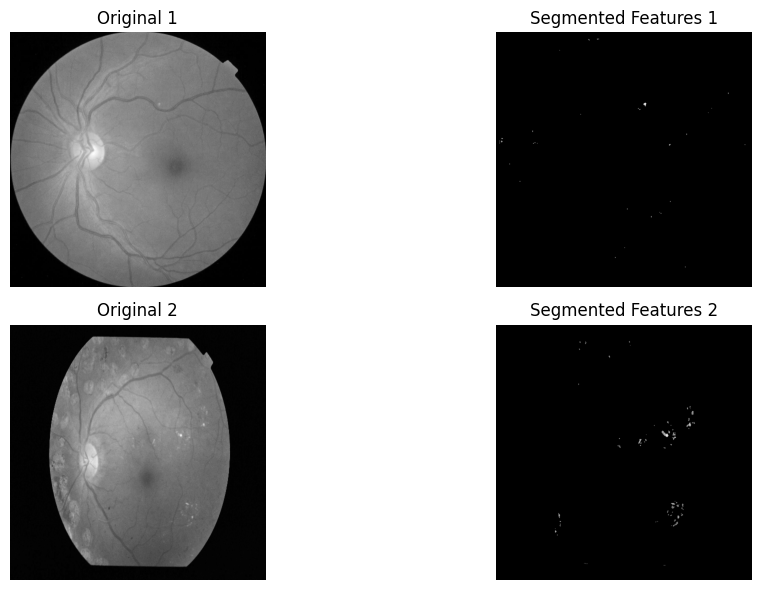

Do the segmented features look correct? (yes/no):  yes



Processing 2930 images...


100%|██████████| 2930/2930 [08:18<00:00,  5.87it/s]


Done! Segmented features saved to /kaggle/working/segmented_features_exudates


In [ ]:
# Test processing
plt.figure(figsize=(12, 6))
for idx, img_path in enumerate(test_image_paths):

    img = cv2.imread(img_path, 0)
    img = cv2.resize(img, (512, 512))
    img_input = img.astype('float32').reshape(1, 512, 512, 1)
    
    prediction = loaded_model.predict(img_input, verbose=0)
    mask = (prediction.squeeze() > 0.5).astype('uint8') * 255
    
    segmented_features = cv2.bitwise_and(img, img, mask=mask)
    
    plt.subplot(2, 2, idx*2 + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Original {idx+1}')
    plt.axis('off')
    
    plt.subplot(2, 2, idx*2 + 2)
    plt.imshow(segmented_features, cmap='gray')
    plt.title(f'Segmented Features {idx+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

response = input("Do the segmented features look correct? (yes/no): ")

if response.lower() == 'yes':
    output_dir = '/kaggle/working/segmented_features_exudates'
    os.makedirs(output_dir, exist_ok=True)
    
    input_dir = '/kaggle/input/aptos2019/train_images/train_images'
    image_files = [f for f in os.listdir(input_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    
    print(f"\nProcessing {len(image_files)} images...")
    
    for img_name in tqdm(image_files):
        try:
            img_path = os.path.join(input_dir, img_name)
            img = cv2.imread(img_path, 0)
            img = cv2.resize(img, (512, 512))
            img_input = img.astype('float32').reshape(1, 512, 512, 1)
            
            
            prediction = loaded_model.predict(img_input, verbose=0)
            mask = (prediction.squeeze() > 0.5).astype('uint8') * 255
            
        
            segmented_features = cv2.bitwise_and(img, img, mask=mask)
            
            
            output_path = os.path.join(output_dir, img_name)
            cv2.imwrite(output_path, segmented_features)
            
        except Exception as e:
            print(f"\nError processing {img_name}: {str(e)}")
            continue
    
    print(f"\nDone! Segmented features saved to {output_dir}")
else:
    print("Process cancelled. Please adjust parameters as needed.")

In [ ]:
import shutil
import os


input_dir = '/kaggle/working/segmented_features'


output_zip = '/kaggle/working/segmented_features.zip'
shutil.make_archive('/kaggle/working/segmented_features', 'zip', input_dir)

print(f"Created zip file at: {output_zip}")
print("You can now download this file from the Kaggle notebook output.")

Created zip file at: /kaggle/working/segmented_features.zip
You can now download this file from the Kaggle notebook output.


In [43]:
!zip -r file.zip /kaggle/working

updating: kaggle/working/ (stored 0%)
updating: kaggle/working/.zip (stored 0%)
updating: kaggle/working/joined.csv (deflated 97%)
updating: kaggle/working/mask.csv (deflated 96%)
updating: kaggle/working/.virtual_documents/ (stored 0%)
updating: kaggle/working/original.csv (deflated 95%)
updating: kaggle/working/mask_filtered.csv (deflated 96%)
updating: kaggle/working/segmented_dataset/ (stored 0%)
updating: kaggle/working/segmented_dataset/masks/ (stored 0%)
updating: kaggle/working/segmented_dataset/masks/c70d09370109.png (deflated 51%)
updating: kaggle/working/segmented_dataset/masks/6b07971c3bf6.png (deflated 55%)
updating: kaggle/working/segmented_dataset/masks/9faad91b6578.png (deflated 20%)
updating: kaggle/working/segmented_dataset/masks/4dc2211a1c31.png (deflated 20%)
updating: kaggle/working/segmented_dataset/masks/6cfb7b44ef6f.png (deflated 91%)
updating: kaggle/working/segmented_dataset/masks/6ba5ed791444.png (deflated 24%)
updating: kaggle/working/segmented_dataset/masks

In [45]:
from IPython.display import FileLink
FileLink(r'file.zip')

/kaggle/working/file.zip

# Blood vessles